<a href="https://colab.research.google.com/github/NJain121442/course2020/blob/master/17August_SEM_UNET_V1_90Class_HKMG.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch.nn as nn
import glob
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn.functional as F
import torch.optim as optim
from IPython.display import clear_output
from torchvision import datasets, transforms
import numpy as np
from torchsummary import summary 
import matplotlib.image as mpimg
import torchvision
from PIL import Image
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow

In [2]:
from google.colab import drive 
drive.mount("/content/drive")

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [3]:
#!unzip '/content/drive/My Drive/AutoEncoder_training.zip' -d '/content/drive/My Drive/AutoEncoder_training' 

In [4]:
#!unzip '/content/drive/My Drive/HKMG-FI_180_class_images.zip' -d '/content/drive/My Drive/'

In [5]:
#Data_path = "/content/Fruits/"
Data_path = "/content/drive/My Drive/AutoEncoder_training/AutoEncoder_training/"
#Data_path = "/content/drive/My Drive/All_class_images"

In [6]:
#filelist = glob.glob(Data_path+'/*.jfif')
filelist = glob.glob(Data_path+'/*.tiff')

In [7]:
len(filelist)

90

Lets Resize all images to same size

In [8]:
class CustomDataset(Dataset):
  def __init__(self,path,new_size = 226):
    #self.filelist = glob.glob(path+'/*.jfif')
    self.filelist = glob.glob(path+'/*.tiff')
    self.new_size = new_size

  def __len__(self):
    return len(self.filelist)

  def __getitem__(self, idx):
    temp_filepath = self.filelist[idx]
    temp_image = cv2.imread(temp_filepath)
    #print(temp_image)
    #print('Original Dimensions : ',temp_image.shape)
    #cv2_imshow(temp_image)
    temp_image = cv2.cvtColor(temp_image, cv2.COLOR_BGR2GRAY)
    #print('Original Dimensions : ',temp_image.shape)
    #cv2_imshow(temp_image)
    #dim = (504,504)
    #temp_image = cv2.resize(temp_image, dim, interpolation = cv2.INTER_AREA)
    #print('Resized Dimensions : ',temp_image.shape)
    #cv2_imshow(temp_image)
    #print(temp_image.shape)
    temp_image = temp_image/255
    #plt.imshow(temp_image,cmap='gray',vmin=0,vmax=1)
    #temp_image = torch.from_numpy(temp_image)
    temp_image = torch.Tensor(temp_image)
    #print(temp_image.shape)
    #print(temp_image)
    temp_image = temp_image.unsqueeze(0)
    #print(temp_image.shape)
    return temp_image

In [9]:
Data = CustomDataset(Data_path)
Data[2].shape

torch.Size([1, 504, 504])

In [10]:
latent_dim = 128

class Encoder(nn.Module):
    def __init__(self):
        super(Encoder,self).__init__()
        self.enc1 = nn.Conv2d(1,64,kernel_size=3,stride=3)
        self.enc2 = nn.Conv2d(64,128,kernel_size=3,stride=3)
        self.enc3 = nn.Conv2d(128,256,kernel_size=2,stride=3)
        self.pool = nn.MaxPool2d(2,2,return_indices=True)
        self.FC1 = nn.Linear(6400,1024)
        self.FC2 = nn.Linear(1024,latent_dim)

    def forward(self,x):
        conv1 = F.relu(self.enc1(x)) # output will be 168x168x64
        x,indices1 = self.pool(conv1) #output will be 84x84x64
        conv2 = F.relu(self.enc2(x)) #output will be 28x28x128
        x,indices2 = self.pool(conv2)   # output will be 14x14x128
        conv3 = F.relu(self.enc3(x)) #output will be 5x5x256 
        x = conv3.view(-1,6400) # after flattening the size will be 6400
        x = F.relu(self.FC1(x))
        x = F.relu(self.FC2(x)) # the latent space representation
        return x,indices1,indices2,conv3,conv2,conv1
    
class Decoder(nn.Module):
    def __init__(self):
        super(Decoder,self).__init__()
        self.FC3 = nn.Linear(latent_dim,1024)
        self.FC4 = nn.Linear(1024,6400)
        self.dec1 = nn.ConvTranspose2d(256 + 256,128, kernel_size=2, stride=3)  
        self.dec2 = nn.ConvTranspose2d(128 + 128,64, kernel_size=3, stride=3)
        self.dec3 = nn.ConvTranspose2d(64 + 64 ,1, kernel_size=3, stride=3)
        self.unpool = nn.MaxUnpool2d(2,2,padding=0)
        
        
    def forward(self,x,indices1,indices2,conv3,conv2,conv1):
        x = F.relu(self.FC3(x)) #size back to 1024
        x = F.relu(self.FC4(x)) #size back to 6400
        x = torch.reshape(x,(1,256,5,5))
        x = torch.cat([x,conv3],dim=1)
        x = F.relu(self.dec1(x)) # ouput will be 14x14x128
        x = self.unpool(x,indices2) #output will be 28x28x128
        x = torch.cat([x,conv2],dim=1)
        x = F.relu(self.dec2(x)) # output will be 84x84x64
        x = self.unpool(x,indices1) #output will be 168x168x64
        x = torch.cat([x,conv1],dim=1)
        #x = self.dec3(x) # output will be 504x504x1
        x = torch.sigmoid(self.dec3(x)) # output will be 504x504x1
        return x
    
class Conv2d_AutoEncoder(nn.Module):
    def __init__(self):
        super(Conv2d_AutoEncoder, self).__init__()

        self.enc = Encoder()
        self.dec = Decoder()

    def forward(self, x):
        
        z,indices1,indices2,conv3,conv2,conv1 = self.enc(x)
        
        out = self.dec(z,indices1,indices2,conv3,conv2,conv1)
        
        return out

**Lets write the first Auto encoder **

In [11]:
net = Conv2d_AutoEncoder()
print(net)
if torch.cuda.is_available():
    net.cuda()
#summary(net,input_size=(1,504,504))

Conv2d_AutoEncoder(
  (enc): Encoder(
    (enc1): Conv2d(1, 64, kernel_size=(3, 3), stride=(3, 3))
    (enc2): Conv2d(64, 128, kernel_size=(3, 3), stride=(3, 3))
    (enc3): Conv2d(128, 256, kernel_size=(2, 2), stride=(3, 3))
    (pool): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (FC1): Linear(in_features=6400, out_features=1024, bias=True)
    (FC2): Linear(in_features=1024, out_features=128, bias=True)
  )
  (dec): Decoder(
    (FC3): Linear(in_features=128, out_features=1024, bias=True)
    (FC4): Linear(in_features=1024, out_features=6400, bias=True)
    (dec1): ConvTranspose2d(512, 128, kernel_size=(2, 2), stride=(3, 3))
    (dec2): ConvTranspose2d(256, 64, kernel_size=(3, 3), stride=(3, 3))
    (dec3): ConvTranspose2d(128, 1, kernel_size=(3, 3), stride=(3, 3))
    (unpool): MaxUnpool2d(kernel_size=(2, 2), stride=(2, 2), padding=(0, 0))
  )
)


In [12]:
train_loader = DataLoader(Data,batch_size=1)

In [13]:
loss_func = nn.MSELoss()
#loss_func = nn.L1Loss()
optimizer = optim.Adam(net.parameters(), lr=0.0001) 


Training the Auto encoder

In [14]:
!pip install kornia
from kornia import filters

     |████████████████████████████████| 204kB 4.5MB/s 


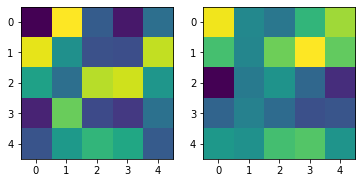

In [15]:
input = torch.rand(2, 4, 5, 5)
fig,ax = plt.subplots(1,2)
ax[0].imshow(input[0][0])
SpatialGradient = filters.SpatialGradient()
output = SpatialGradient(input)
ax[1].imshow(output[0][0][1])

In [16]:
from tqdm.notebook import tqdm
import matplotlib.pyplot as plt

n_epochs = 100

if torch.cuda.is_available():
    net.cuda()
total_loss = []

epoch_loss = 0
net.train()
for epoch in tqdm(range(n_epochs)):
    print("current epoch is:",epoch)
    epoch_loss = 0
    for x in train_loader:
        mse_loss = 0
        if torch.cuda.is_available():
          x = x.cuda()
        optimizer.zero_grad()
        prediction = net(x)
        loss_der = loss_func(SpatialGradient(prediction), SpatialGradient(x))
        mse_loss = loss_func(prediction, x) # <-- note that i'm using the input as the target
        (mse_loss+loss_der).backward()
        optimizer.step()
        epoch_loss = epoch_loss + mse_loss.item() + loss_der.item()

        
    #clear_output(wait=True)
    total_loss.append(epoch_loss)
    print('Loss Per epoch: ',epoch_loss)

current epoch is: 0
Loss Per epoch:  4.387994100223295
current epoch is: 1
Loss Per epoch:  3.654080074513331
current epoch is: 2
Loss Per epoch:  3.2291905605234206
current epoch is: 3
Loss Per epoch:  2.7734184593427926
current epoch is: 4
Loss Per epoch:  2.3814828741014935
current epoch is: 5
Loss Per epoch:  2.065258584683761
current epoch is: 6
Loss Per epoch:  1.7993245595134795
current epoch is: 7
Loss Per epoch:  1.5894201269256882
current epoch is: 8
Loss Per epoch:  1.4308803213643841
current epoch is: 9
Loss Per epoch:  1.3045928197680041
current epoch is: 10
Loss Per epoch:  1.1984569396008737
current epoch is: 11
Loss Per epoch:  1.1085011547547765
current epoch is: 12
Loss Per epoch:  1.0289016873575747
current epoch is: 13
Loss Per epoch:  0.9564342644298449
current epoch is: 14
Loss Per epoch:  0.8887302249786444
current epoch is: 15
Loss Per epoch:  0.8259564856707584
current epoch is: 16
Loss Per epoch:  0.7669034983264282
current epoch is: 17
Loss Per epoch:  0.7110

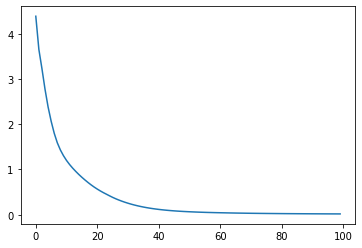

In [17]:
import matplotlib.pyplot as plt
plt.plot(total_loss)

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


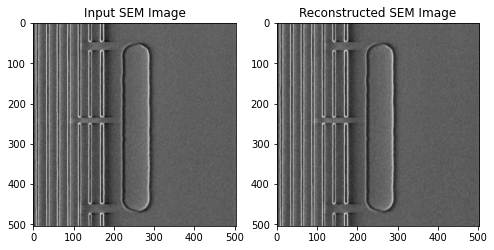

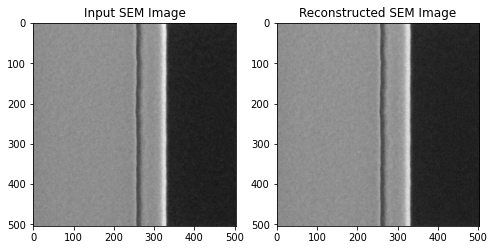

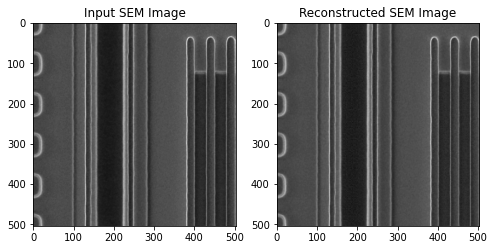

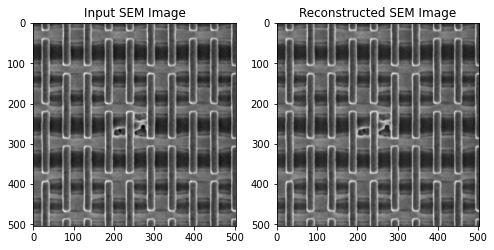

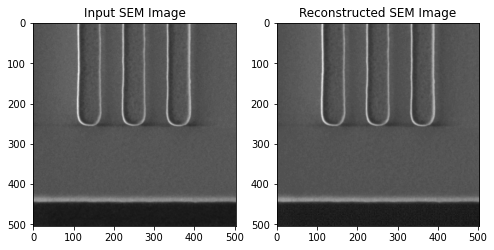

...

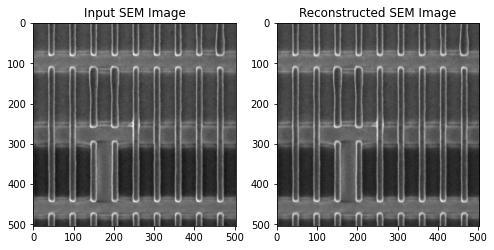

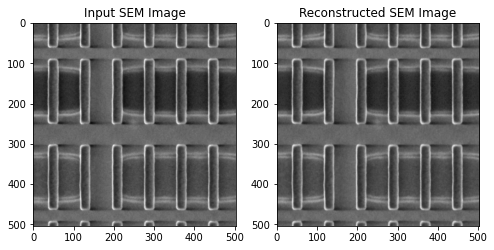

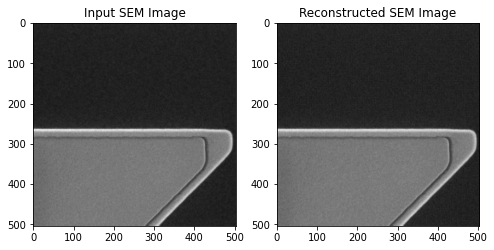

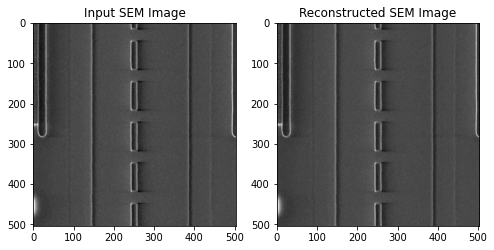

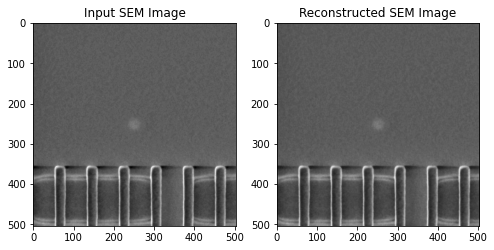

In [18]:
net.cpu()
net.eval()
counter = 0
for i in range(30):
    counter = counter + 1
    fig,ax = plt.subplots(1,2,figsize=(8,4))
    x = Data[i]
    input_img = x[0]
    #print(input_img)
    model_pred = net(x.unsqueeze(0))[0].cpu().data.numpy()[0]
    #print(model_pred)
    ax[0].set_title('Input SEM Image',fontsize=12)
    ax[1].set_title('Reconstructed SEM Image',fontsize=12)
    ax[0].imshow(input_img,cmap='gray',vmin=0,vmax=1)
    ax[1].imshow(model_pred,cmap='gray',vmin=0,vmax=1)


Extract Latent representation from Encoder 

Do Clustering and calculate Silhouette Score

In [28]:
from sklearn.cluster import KMeans
from sklearn import preprocessing
from sklearn.metrics import silhouette_samples, silhouette_score
Encoder_net = Encoder()
Attributes = np.empty([len(train_loader),latent_dim])
#print(Attributes.shape)
for i,x in enumerate(Data):
  Temp_results = Encoder_net(x.unsqueeze(0))
  #print(Temp_results[0])
  Temp_Attributes = (Temp_results[0]).cpu().data.numpy()
  #print("Temp_Attributes:",Temp_Attributes)
  Attributes[i] = Temp_Attributes
  #print(Attributes[i].shape)
print(Attributes.shape)
print(Attributes)

(90, 128)
[[0.01307125 0.00991018 0.         ... 0.02477524 0.         0.        ]
 [0.01514665 0.00796757 0.         ... 0.01914616 0.         0.        ]
 [0.01060806 0.01020869 0.         ... 0.02526239 0.         0.        ]
 ...
 [0.01796737 0.01103594 0.         ... 0.02672469 0.         0.        ]
 [0.01206357 0.0094084  0.         ... 0.02911905 0.         0.        ]
 [0.01300186 0.01100023 0.         ... 0.02395926 0.         0.        ]]


In [31]:
k=15
Attributes_scaled = preprocessing.scale(Attributes)
print(Attributes_scaled.shape)
print(Attributes_scaled.mean(axis=0))
print(Attributes_scaled.std(axis=0))
kmeans = KMeans(n_clusters=k,random_state=0).fit(Attributes_scaled)
Clustering_labels = kmeans.labels_
print(Clustering_labels)
Score = silhouette_score(Attributes_scaled,Clustering_labels,metric='euclidean')
print(Score)
sample_score = silhouette_samples(Attributes_scaled,Clustering_labels,metric='euclidean')
#print(sample_score)

(90, 128)
[-1.12602828e-16  3.15179981e-16  0.00000000e+00  8.63506797e-17
  4.42855629e-16  1.97372982e-17  0.00000000e+00  0.00000000e+00
  4.31753398e-17  0.00000000e+00  0.00000000e+00  1.81336427e-16
  6.41462192e-17 -7.03758039e-16  2.40548322e-17 -1.39394669e-16
 -9.86864911e-18 -5.92118946e-17  0.00000000e+00 -6.71068139e-16
 -2.71387850e-16 -4.73386762e-16  0.00000000e+00  0.00000000e+00
 -3.17030353e-16 -1.37235902e-16  0.00000000e+00  0.00000000e+00
 -1.60365548e-16  0.00000000e+00  7.40148683e-18 -1.06087978e-16
  0.00000000e+00 -2.15876699e-16 -1.87504333e-16  0.00000000e+00
  0.00000000e+00  6.74768883e-16  0.00000000e+00 -3.70074342e-17
  0.00000000e+00 -7.86407976e-17  2.10479782e-16  0.00000000e+00
 -3.08395285e-18  1.38161088e-16  0.00000000e+00 -3.35534070e-16
 -1.45562574e-16  0.00000000e+00  3.06005221e-16  0.00000000e+00
  0.00000000e+00  1.80102846e-16  0.00000000e+00  1.78869265e-16
  0.00000000e+00  0.00000000e+00  0.00000000e+00  0.00000000e+00
  8.94346325e-1

In [32]:
max(sample_score)

0.36306220850388204

Find Optimal K using Silhouette score

In [33]:
k_range = 20
Score = np.empty(20)
for k in range(k_range):
  kmeans = KMeans(n_clusters=k+2,random_state=0).fit(Attributes_scaled)
  Clustering_labels_k = kmeans.labels_
  Score[k] = silhouette_score(Attributes_scaled,Clustering_labels_k,metric='euclidean')
print(Score)
Max_score_k = np.argmax(Score) + 2
print(Max_score_k)


[0.11435575 0.06197864 0.07324675 0.0823853  0.06782897 0.06829384
 0.06763636 0.06296721 0.0611023  0.063969   0.06676322 0.06499075
 0.06913441 0.06530277 0.06391572 0.06334868 0.06781759 0.0606245
 0.0669092  0.06254287]
2


In [34]:
import pandas as pd 
column_names = ["Image","Label","sample_score"]
df = pd.DataFrame(columns = column_names,index=np.arange(len(Data)))
df['Image'][88]

for i,x in enumerate(Data):
  df['Image'][i] = (x[0]).data.numpy()
  df['Label'][i] = Clustering_labels[i]
  df['sample_score'][i] = sample_score[i]
  #print(input_img)

In [35]:
df

,Image,Label,sample_score
0,"[[0.3647059, 0.36862746, 0.3647059, 0.3529412,...",2,0.0765791
1,"[[0.5372549, 0.53333336, 0.53333336, 0.5372549...",11,0.10889
2,"[[0.25882354, 0.25882354, 0.26666668, 0.262745...",5,-0.0440407
3,"[[0.19607843, 0.2, 0.20392157, 0.21568628, 0.2...",13,0.10151
4,"[[0.3254902, 0.3254902, 0.3254902, 0.32941177,...",6,0.0309315
...,...,...,...
85,"[[0.32941177, 0.32941177, 0.32941177, 0.325490...",7,-0.0118689
86,"[[0.49411765, 0.49019608, 0.4862745, 0.4745098...",11,0.356345
87,"[[0.22352941, 0.21176471, 0.1882353, 0.1882353...",3,-0.00498735
88,"[[0.1254902, 0.13333334, 0.14901961, 0.1607843...",5,0.0144137


In [36]:
df= df.sort_values('Label',ignore_index=True)
print(df)
df['Image'][80]

                                                Image Label sample_score
0   [[0.32941177, 0.3254902, 0.32941177, 0.3647059...     0     0.132151
1   [[0.20392157, 0.2, 0.19607843, 0.1882353, 0.18...     0    0.0459801
2   [[0.17254902, 0.18431373, 0.23137255, 0.309803...     0    0.0215016
3   [[0.31764707, 0.34901962, 0.45490196, 0.623529...     0     0.174468
4   [[0.35686275, 0.34901962, 0.3372549, 0.3647059...     0     0.173022
..                                                ...   ...          ...
85  [[0.3372549, 0.33333334, 0.33333334, 0.3450980...    13    0.0913149
86  [[0.6862745, 0.7176471, 0.83137256, 0.88235295...    13   -0.0357776
87  [[0.34901962, 0.34901962, 0.36078432, 0.364705...    13    0.0515877
88  [[0.35686275, 0.34509805, 0.3372549, 0.3254902...    13     0.141292
89  [[0.28627452, 0.28627452, 0.2901961, 0.2941176...    14            0

[90 rows x 3 columns]


array([[0.29803923, 0.3019608 , 0.31764707, ..., 0.36862746, 0.3764706 ,
        0.38039216],
       [0.29411766, 0.29803923, 0.3137255 , ..., 0.36862746, 0.3764706 ,
        0.38039216],
       [0.28627452, 0.2901961 , 0.30980393, ..., 0.36862746, 0.3764706 ,
        0.3764706 ],
       ...,
       [0.3882353 , 0.3882353 , 0.3882353 , ..., 0.36862746, 0.38039216,
        0.38039216],
       [0.39607844, 0.39607844, 0.39607844, ..., 0.36862746, 0.38039216,
        0.38431373],
       [0.4       , 0.4       , 0.4       , ..., 0.36862746, 0.38039216,
        0.38431373]], dtype=float32)

90


<function matplotlib.pyplot.show>

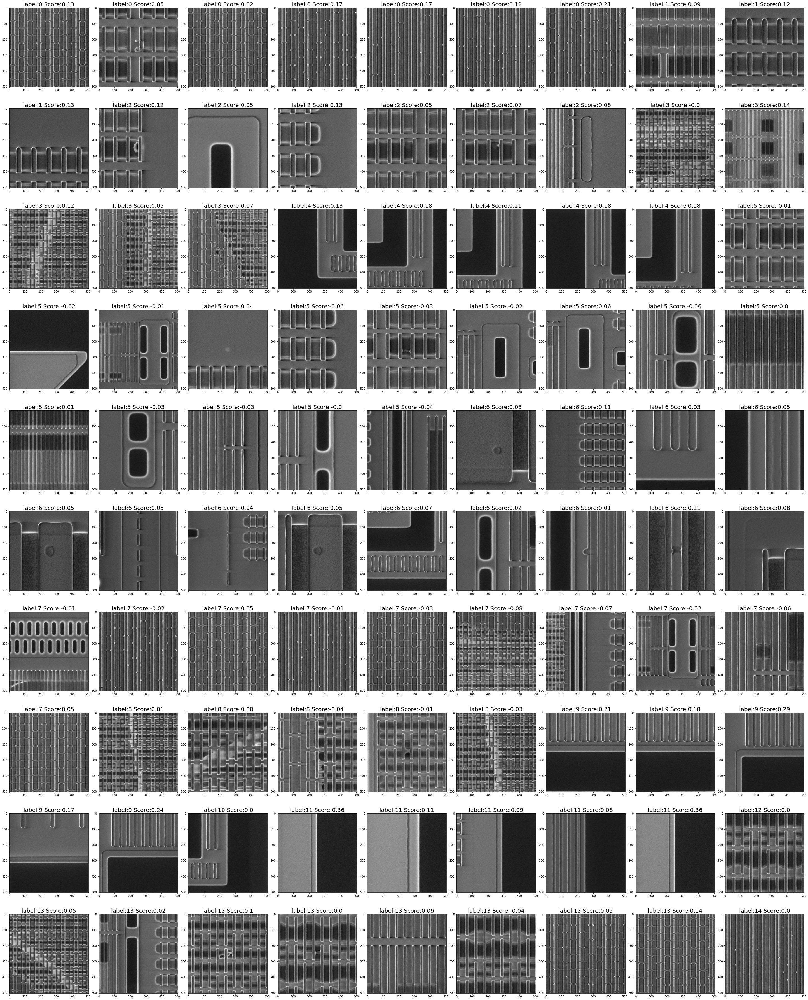

In [37]:
ncols = 9
print(len(Data))
nrows = int(len(Data)/ncols)
figsize = [40,50]  
fig,ax = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)
axi = ax.flat
#print(len(axi))
for i,x in enumerate(Data):
  input_img = df['Image'][i]
  axi[i].set_title("label:"+str(df['Label'][i])+" "+"Score:"+str(round(df['sample_score'][i],2)),fontsize =20)
  #plt.title('Input SEM Image',fontsize=6)
  axi[i].imshow(input_img,cmap='gray',vmin=0,vmax=1)
fig.tight_layout(pad=0.3)
plt.show